In [1]:
# imports
import panel as pn
pn.extension('plotly')
import plotly.express as px
import pandas as pd
import hvplot.pandas
import matplotlib.pyplot as plt
import numpy as np
import os
from pathlib import Path
from dotenv import load_dotenv

import warnings
warnings.filterwarnings('ignore')
from requests import Request, Session
from requests.exceptions import ConnectionError, Timeout, TooManyRedirects
import json
import requests

In [2]:
#!pip install yfinance
#!pip install pyfolio
#!pip install seaborn

In [3]:
import yfinance as yf
import pyfolio as pf
import seaborn as sns

In [4]:
#Retrieving data from Yahoo finance api

In [5]:
btc_data = yf.download(tickers='BTC-USD', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [6]:
xrp_data = yf.download(tickers='XRP-USD', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [7]:
eth_data = yf.download(tickers='ETH-USD', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [8]:
doge_data = yf.download(tickers='DOGE-USD', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [9]:
ltc_data = yf.download(tickers='LTC-USD', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [10]:
spy_data = yf.download(tickers='^GSPC', start='2016-06-15', interval='1d')

[*********************100%***********************]  1 of 1 completed


In [11]:
bond_data_5yr = yf.download(tickers='^FVX', start = '2016-06-15', interval = '1d')

[*********************100%***********************]  1 of 1 completed


In [12]:
bond_data_10yr = yf.download(tickers='^TNX', start = '2016-06-15', interval = '1d')

[*********************100%***********************]  1 of 1 completed


In [13]:
gold_data = yf.download(tickers='GLD', start = '2016-06-15', interval = '1d')

[*********************100%***********************]  1 of 1 completed


In [14]:
#cleaning, sorting data
btc = btc_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
btc.rename(columns={'Close': 'BTC'}, inplace = True)
xrp = xrp_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
xrp.rename(columns={'Close': 'XRP'}, inplace = True)
eth = eth_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
eth.rename(columns={'Close': 'ETH'}, inplace = True)
ltc = ltc_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
ltc.rename(columns={'Close': 'LTC'}, inplace = True)
doge = doge_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
doge.rename(columns={'Close': 'DOGE'}, inplace = True)
spy = spy_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
spy.rename(columns={'Close': '^GSPC'}, inplace = True)
bond_5yr = bond_data_5yr.drop(columns = ['Open','High','Low','Adj Close','Volume'])
bond_5yr.rename(columns={'Close': '5yr Bond'}, inplace = True)
bond_10yr = bond_data_10yr.drop(columns = ['Open','High','Low','Adj Close','Volume'])
bond_10yr.rename(columns={'Close': '10yr Bond'}, inplace = True)
gold = gold_data.drop(columns = ['Open','High','Low','Adj Close','Volume'])
gold.rename(columns={'Close': 'Gold Trust'}, inplace = True)

In [15]:
#Join dataframes
df = pd.concat([btc, xrp, eth, ltc, doge, spy, bond_5yr, bond_10yr, gold], axis='columns', join="outer")
df.dropna(inplace = True)
df

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2016-06-15,694.468994,0.006887,18.354300,5.239780,0.000313,2071.500000,1.099,1.596,123.680000
2016-06-16,766.307983,0.006676,20.588600,5.660790,0.000335,2077.989990,1.078,1.564,122.379997
2016-06-17,748.908997,0.006693,15.376800,5.593270,0.000321,2071.219971,1.121,1.618,123.949997
2016-06-20,737.226013,0.006626,11.839500,5.294540,0.000323,2083.250000,1.163,1.670,123.209999
2016-06-21,666.651978,0.006172,13.306700,4.821750,0.000307,2088.899902,1.194,1.697,120.839996
...,...,...,...,...,...,...,...,...,...
2021-06-14,40218.476562,0.892897,2537.891113,172.949097,0.332085,4255.149902,0.787,1.501,174.710007
2021-06-15,40406.269531,0.889800,2610.936768,178.659424,0.328381,4246.589844,0.785,1.499,174.050003
2021-06-16,38347.062500,0.831908,2367.663574,166.458939,0.307761,4223.700195,0.882,1.569,171.110001


In [16]:
#Save dataframe as csv
df.to_csv(fr'C:\Users\Kris\Desktop\Project_I\df.csv')

In [17]:
df_daily_returns = df.pct_change()
df_daily_returns

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2016-06-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-16,0.103444,-0.030637,0.121732,0.080349,0.070288,0.003133,-0.019108,-0.020050,-0.010511
2016-06-17,-0.022705,0.002546,-0.253140,-0.011928,-0.041791,-0.003258,0.039889,0.034527,0.012829
2016-06-20,-0.015600,-0.010010,-0.230041,-0.053409,0.006230,0.005808,0.037466,0.032138,-0.005970
2016-06-21,-0.095729,-0.068518,0.123924,-0.089298,-0.049536,0.002712,0.026655,0.016168,-0.019235
...,...,...,...,...,...,...,...,...,...
2021-06-14,0.077250,0.052386,0.078224,0.061816,0.039849,0.001815,0.052139,0.026676,-0.005861
2021-06-15,0.004669,-0.003468,0.028782,0.033017,-0.011154,-0.002012,-0.002541,-0.001333,-0.003778
2021-06-16,-0.050963,-0.065062,-0.093175,-0.068289,-0.062793,-0.005390,0.123567,0.046698,-0.016892


In [18]:
# Plot daily returns of all crypto
df_daily_returns.hvplot(title="Daily Returns", figsize = (30, 20))

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [19]:
# Calculate cumulative returns of all portfolios
cumulative_returns = (1 + df_daily_returns).cumprod()
cumulative_returns

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2016-06-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-06-16,1.103444,0.969363,1.121732,1.080349,1.070288,1.003133,0.980892,0.979950,0.989489
2016-06-17,1.078391,0.971831,0.837776,1.067463,1.025559,0.999865,1.020018,1.013785,1.002183
2016-06-20,1.061568,0.962103,0.645053,1.010451,1.031949,1.005672,1.058235,1.046366,0.996200
2016-06-21,0.959945,0.896181,0.724991,0.920220,0.980831,1.008400,1.086442,1.063283,0.977037
...,...,...,...,...,...,...,...,...,...
2021-06-14,57.912559,129.649630,138.272295,33.006939,1060.974494,2.054139,0.716106,0.940476,1.412597
2021-06-15,58.182971,129.199943,142.252052,34.096742,1049.140592,2.050007,0.714286,0.939223,1.407261
2021-06-16,55.217818,120.793957,128.997763,31.768307,983.262034,2.038957,0.802548,0.983083,1.383490


In [20]:
#Plot cumulative returns
cumulative_returns.hvplot(title = 'Cumulative Returns 5 year', figsize = (20, 10))

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [21]:
# Box plot to visually show risk
cumulative_returns.hvplot.box(title = "Crypto Risk" , figsize = (20, 10))

:BoxWhisker   [Variable]   (value)

In [22]:
# Calculate the daily standard deviations of all portfolios
daily_std = df_daily_returns.std().sort_values(ascending=False)
daily_std

DOGE          0.129811
XRP           0.094047
LTC           0.073790
ETH           0.071039
BTC           0.048429
5yr Bond      0.046471
10yr Bond     0.037693
^GSPC         0.011994
Gold Trust    0.008655
dtype: float64

In [23]:
# Calculate the annualized standard deviation (252 trading days)
annualized_std = daily_std *np.sqrt(252)
annualized_std.sort_values(ascending=False)

DOGE          2.060690
XRP           1.492943
LTC           1.171387
ETH           1.127712
BTC           0.768782
5yr Bond      0.737700
10yr Bond     0.598355
^GSPC         0.190392
Gold Trust    0.137393
dtype: float64

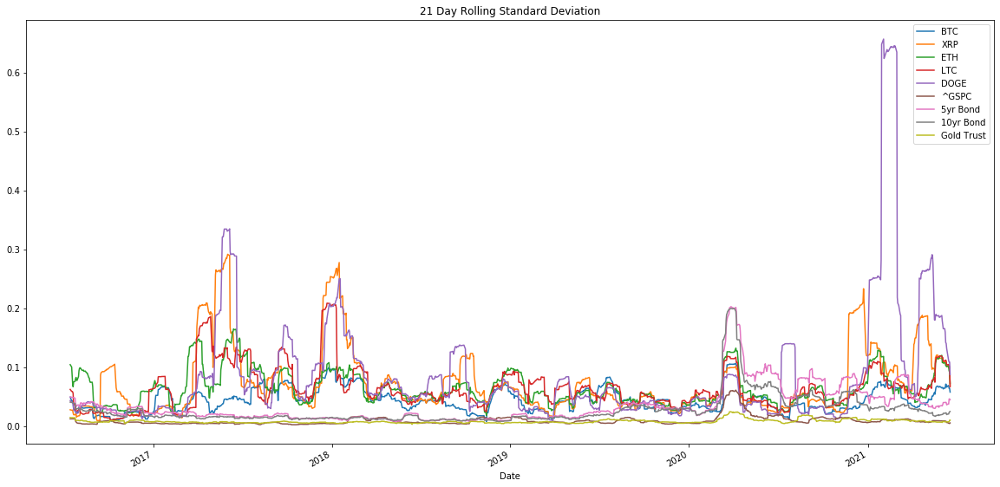

In [24]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
# Plot the rolling standard deviation
df_daily_returns.rolling(window=21).std().plot(title="21 Day Rolling Standard Deviation", figsize = (20, 10))

In [25]:
# Calculate the correlation
# Display de correlation matrix
correlation = df_daily_returns.corr()
correlation

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
BTC,1.000000,0.367391,0.601461,0.616334,0.376804,0.178594,0.013174,0.031287,0.109962
XRP,0.367391,1.000000,0.352519,0.407843,0.292543,0.133387,0.012750,0.025566,0.028316
ETH,0.601461,0.352519,1.000000,0.570356,0.358781,0.195336,0.020237,0.035546,0.098773
LTC,0.616334,0.407843,0.570356,1.000000,0.332750,0.160927,0.024638,0.035122,0.068164
DOGE,0.376804,0.292543,0.358781,0.332750,1.000000,0.056483,-0.003297,0.012864,0.065541
^GSPC,0.178594,0.133387,0.195336,0.160927,0.056483,1.000000,0.344255,0.377576,0.048136
5yr Bond,0.013174,0.012750,0.020237,0.024638,-0.003297,0.344255,1.000000,0.921671,-0.313140
10yr Bond,0.031287,0.025566,0.035546,0.035122,0.012864,0.377576,0.921671,1.000000,-0.303807
Gold Trust,0.109962,0.028316,0.098773,0.068164,0.065541,0.048136,-0.313140,-0.303807,1.000000


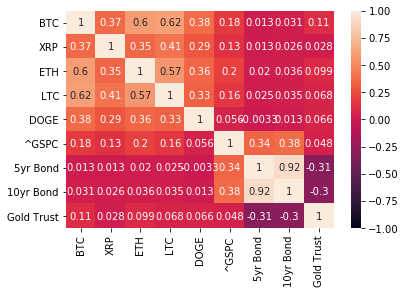

In [26]:
sns.heatmap(correlation,  vmin=-1, vmax=1,annot=True)

In [27]:
# Slice dataframe for 1 year returns
df_1yr = df.loc['2020-06-16':'2021-06-16']
df_1yr

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2020-06-16,9538.024414,0.191307,234.416168,43.877258,0.002487,3124.739990,0.350,0.756,162.250000
2020-06-17,9480.254883,0.193443,233.028275,44.032356,0.002485,3113.489990,0.339,0.733,162.559998
2020-06-18,9411.840820,0.190957,232.101166,43.560131,0.002472,3115.340088,0.328,0.694,162.240005
2020-06-19,9288.018555,0.186790,227.138290,42.679832,0.002435,3097.739990,0.327,0.697,164.029999
2020-06-22,9648.717773,0.189272,242.533188,44.188004,0.002474,3117.860107,0.335,0.704,165.089996
...,...,...,...,...,...,...,...,...,...
2021-06-10,36702.597656,0.869182,2471.518555,168.203064,0.326351,4239.180176,0.731,1.459,177.740005
2021-06-11,37334.398438,0.848450,2353.768799,162.880524,0.319359,4247.439941,0.748,1.462,175.740005
2021-06-14,40218.476562,0.892897,2537.891113,172.949097,0.332085,4255.149902,0.787,1.501,174.710007


In [28]:
#Calculate pct_change of 1 year data
df_1yr_daily_returns = df_1yr.pct_change()
df_1yr_daily_returns

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2020-06-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-17,-0.006057,0.011165,-0.005921,0.003535,-0.000804,-0.003600,-0.031429,-0.030423,0.001911
2020-06-18,-0.007216,-0.012851,-0.003979,-0.010725,-0.005231,0.000594,-0.032448,-0.053206,-0.001968
2020-06-19,-0.013156,-0.021822,-0.021382,-0.020209,-0.014968,-0.005649,-0.003049,0.004323,0.011033
2020-06-22,0.038835,0.013288,0.067778,0.035337,0.016016,0.006495,0.024465,0.010043,0.006462
...,...,...,...,...,...,...,...,...,...
2021-06-10,-0.017205,-0.055272,-0.052429,-0.022863,-0.049457,0.004652,-0.018792,-0.020148,0.004294
2021-06-11,0.017214,-0.023852,-0.047643,-0.031644,-0.021425,0.001948,0.023256,0.002056,-0.011252
2021-06-14,0.077250,0.052386,0.078224,0.061816,0.039849,0.001815,0.052139,0.026676,-0.005861


In [29]:
# Plot daily returns of all crypto
df_1yr_daily_returns.hvplot(title="Daily Returns", figsize = (30, 20))

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [30]:
# Calculate cumulative returns of all portfolios
cumulative_returns_1yr = (1 + df_1yr_daily_returns).cumprod()
cumulative_returns_1yr

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
Date,,,,,,,,,
2020-06-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-06-17,0.993943,1.011165,0.994079,1.003535,0.999196,0.996400,0.968571,0.969577,1.001911
2020-06-18,0.986770,0.998170,0.990124,0.992772,0.993969,0.996992,0.937143,0.917989,0.999938
2020-06-19,0.973789,0.976389,0.968953,0.972710,0.979091,0.991359,0.934286,0.921958,1.010971
2020-06-22,1.011605,0.989363,1.034627,1.007082,0.994773,0.997798,0.957143,0.931217,1.017504
...,...,...,...,...,...,...,...,...,...
2021-06-10,3.848029,4.543388,10.543294,3.833491,131.222749,1.356651,2.088571,1.929894,1.095470
2021-06-11,3.914270,4.435018,10.040983,3.712186,128.411337,1.359294,2.137143,1.933862,1.083143
2021-06-14,4.216646,4.667352,10.826434,3.941657,133.528349,1.361761,2.248571,1.985450,1.076795


In [31]:
#Plot 1 year cumulative returns
cumulative_returns_1yr.hvplot(title = 'Cumulative Returns 1 year', figsize = (20, 10))

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [32]:
# Box plot to visually show risk
cumulative_returns_1yr.hvplot.box(title = "Crypto Risk" , figsize = (20, 10))

:BoxWhisker   [Variable]   (value)

In [33]:
# Calculate the daily standard deviations of all portfolios
daily_std_1yr = df_1yr_daily_returns.std().sort_values(ascending=False)
daily_std_1yr

DOGE          0.231442
XRP           0.106268
ETH           0.068982
LTC           0.068375
5yr Bond      0.060885
BTC           0.046240
10yr Bond     0.037439
Gold Trust    0.010335
^GSPC         0.009908
dtype: float64

In [34]:
# Calculate the rolling standard deviation for all portfolios using a 21-day window
# Plot the rolling standard deviation
df_1yr_daily_returns.rolling(window=21).std().hvplot(title="21 Day Rolling Standard Deviation", figsize = (20, 10))

:NdOverlay   [Variable]
   :Curve   [Date]   (value)

In [35]:
# Calculate the correlation
# Display de correlation matrix
correlation_1yr = df_1yr_daily_returns.corr()
correlation_1yr

,BTC,XRP,ETH,LTC,DOGE,^GSPC,5yr Bond,10yr Bond,Gold Trust
BTC,1.000000,0.339903,0.686793,0.788892,0.311588,0.249675,-0.025839,-0.004263,0.140342
XRP,0.339903,1.000000,0.449241,0.456046,0.177188,0.196363,-0.025497,0.006565,0.014698
ETH,0.686793,0.449241,1.000000,0.779131,0.305063,0.187238,-0.068778,-0.033925,0.169321
LTC,0.788892,0.456046,0.779131,1.000000,0.292625,0.195800,-0.047980,-0.040609,0.192273
DOGE,0.311588,0.177188,0.305063,0.292625,1.000000,-0.033917,-0.027847,0.002497,0.085562
^GSPC,0.249675,0.196363,0.187238,0.195800,-0.033917,1.000000,0.002093,0.071306,0.252184
5yr Bond,-0.025839,-0.025497,-0.068778,-0.047980,-0.027847,0.002093,1.000000,0.919593,-0.337643
10yr Bond,-0.004263,0.006565,-0.033925,-0.040609,0.002497,0.071306,0.919593,1.000000,-0.294647
Gold Trust,0.140342,0.014698,0.169321,0.192273,0.085562,0.252184,-0.337643,-0.294647,1.000000


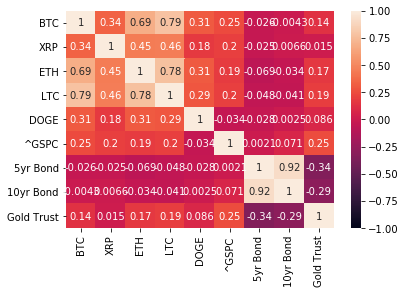

In [36]:
sns.heatmap(correlation_1yr,  vmin=-1, vmax=1,annot=True)

In [37]:
sharpe_ratios = ((df_daily_returns.mean()-df_daily_returns['^GSPC'].mean()) * 252) / (df_daily_returns.std() * np.sqrt(252))
sharpe_ratios

BTC           1.219363
XRP           1.178060
ETH           1.271876
LTC           0.999394
DOGE          1.276456
^GSPC         0.000000
5yr Bond      0.085982
10yr Bond    -0.009409
Gold Trust   -0.669773
dtype: float64

In [38]:
sharpe_ratios.hvplot(kind="bar", title="Sharpe Ratios",height=300, width=600, color='navy')

:Bars   [index]   (0)

In [39]:
sharpe_ratios_Gold = ((df_daily_returns.mean()-df_daily_returns['Gold Trust'].mean()) * 252) / (df_daily_returns.std() * np.sqrt(252))
sharpe_ratios_Gold

BTC           1.339061
XRP           1.239698
ETH           1.353477
LTC           1.077952
DOGE          1.321112
^GSPC         0.483329
5yr Bond      0.210724
10yr Bond     0.144383
Gold Trust    0.000000
dtype: float64

In [40]:
sharpe_ratios_Gold.hvplot(kind="bar", title="Sharpe Ratios",height=300, width=600, color='navy')

:Bars   [index]   (0)

In [41]:
#Rolling Beta of BTC in a 30days cycle
covariance_BTC = df_daily_returns['BTC'].cov(df_daily_returns['^GSPC'])
covariance_BTC

0.000103733276398053

In [42]:
variance_BTC = df_daily_returns['BTC'].var()
variance_BTC

0.0023453414237225444

In [43]:
btc_beta=covariance_BTC / variance_BTC
btc_beta

0.04422949910354916

In [44]:
rolling_covariance_BTC = df_daily_returns['BTC'].rolling(window=30).cov(df_daily_returns['^GSPC'])
rolling_covariance_BTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Covariance of BTC Returns vs. S&P 500 Returns')

:Curve   [Date]   (0)

In [45]:
rolling_variance_BTC = df_daily_returns['^GSPC'].rolling(window=30).var()
rolling_variance_BTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Variance of BTC Returns vs. S&P 500 Returns')

:Curve   [Date]   (^GSPC)

In [46]:
rolling_beta_BTC = rolling_covariance_BTC / rolling_variance_BTC
rolling_beta_BTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Beta of BTC')

:Curve   [Date]   (0)

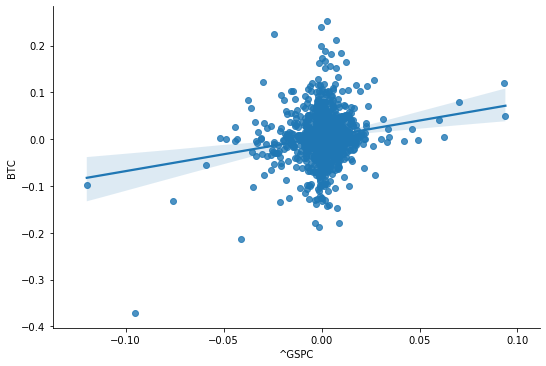

In [47]:
# Showcase beta vs. correlation by plotting a scatterplot using the seaborn library and fitting a regression line
sns.lmplot(x='^GSPC', y='BTC', data=df_daily_returns, aspect=1.5, fit_reg=True)

In [48]:
#Rollign beta of Doge in a 30days cycle
covariance_DOGE = df_daily_returns['DOGE'].cov(df_daily_returns['^GSPC'])
covariance_DOGE

8.793852707296235e-05

In [49]:
variance_DOGE = df_daily_returns['DOGE'].var()
variance_DOGE

0.0168509649141444

In [50]:
Doge_beta=covariance_DOGE / variance_DOGE
Doge_beta

0.00521860484079154

In [51]:
rolling_covariance_DOGE = df_daily_returns['DOGE'].rolling(window=30).cov(df_daily_returns['^GSPC'])
rolling_covariance_DOGE.hvplot(figsize=(20, 10), title='Rolling 30-Day Covariance of DOGE Returns vs. S&P 500 Returns')

:Curve   [Date]   (0)

In [52]:
rolling_variance_DOGE = df_daily_returns['^GSPC'].rolling(window=30).var()
rolling_variance_DOGE.hvplot(figsize=(20, 10), title='Rolling 30-Day Variance of DOGE Returns vs. S&P 500 Returns')

:Curve   [Date]   (^GSPC)

In [53]:
rolling_beta_DOGE = rolling_covariance_DOGE / rolling_variance_DOGE
rolling_beta_DOGE.hvplot(figsize=(20, 10), title='Rolling 30-Day Beta of DOGE')

:Curve   [Date]   (0)

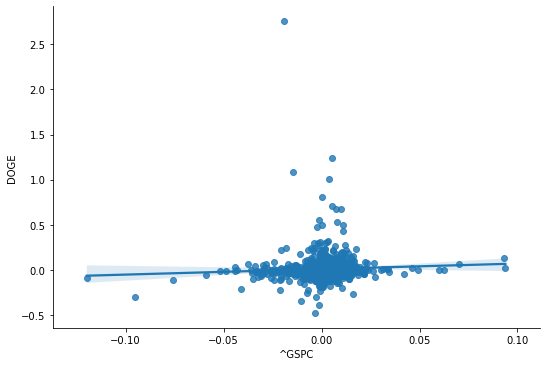

In [54]:
# Showcase beta vs. correlation by plotting a scatterplot using the seaborn library and fitting a regression line
sns.lmplot(x='^GSPC', y='DOGE', data=df_daily_returns, aspect=1.5, fit_reg=True)

In [55]:
#Rolling beta of XRP in a 30days cycle
covariance_XRP = df_daily_returns['XRP'].cov(df_daily_returns['^GSPC'])
covariance_XRP

0.00015045479476782092

In [56]:
variance_XRP = df_daily_returns['XRP'].var()
variance_XRP

0.008844751575566332

In [57]:
XRP_beta=covariance_XRP / variance_XRP
XRP_beta

0.017010629804849804

In [58]:
rolling_covariance_XRP = df_daily_returns['XRP'].rolling(window=30).cov(df_daily_returns['^GSPC'])
rolling_covariance_DOGE.hvplot(figsize=(20, 10), title='Rolling 30-Day Covariance of XRP Returns vs. S&P 500 Returns')

:Curve   [Date]   (0)

In [59]:
rolling_variance_XRP = df_daily_returns['^GSPC'].rolling(window=30).var()
rolling_variance_XRP.hvplot(figsize=(20, 10), title='Rolling 30-Day Variance of XRP Returns vs. S&P 500 Returns')

:Curve   [Date]   (^GSPC)

In [60]:
rolling_beta_XRP = rolling_covariance_XRP / rolling_variance_XRP
rolling_beta_XRP.hvplot(figsize=(20, 10), title='Rolling 30-Day Beta of XRP')

:Curve   [Date]   (0)

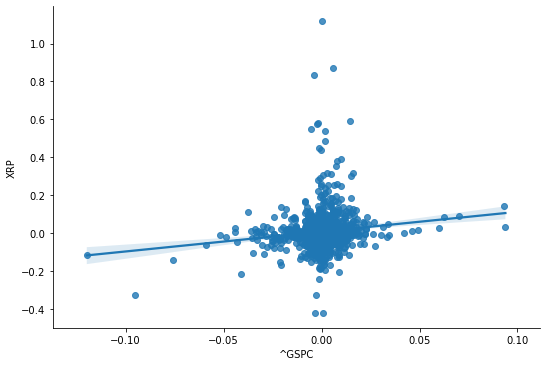

In [61]:
# Showcase beta vs. correlation by plotting a scatterplot using the seaborn library and fitting a regression line
sns.lmplot(x='^GSPC', y='XRP', data=df_daily_returns, aspect=1.5, fit_reg=True)

In [62]:
#rolling beta of ETH
covariance_ETH = df_daily_returns['ETH'].cov(df_daily_returns['^GSPC'])
covariance_ETH

0.00016642857468096036

In [63]:
variance_ETH = df_daily_returns['ETH'].var()
variance_ETH

0.005046563800504618

In [64]:
ETH_beta=covariance_ETH / variance_ETH
ETH_beta

0.032978593209169134

In [65]:
rolling_covariance_ETH = df_daily_returns['ETH'].rolling(window=30).cov(df_daily_returns['^GSPC'])
rolling_covariance_ETH.hvplot(figsize=(20, 10), title='Rolling 30-Day Covariance of ETH Returns vs. S&P 500 Returns')

:Curve   [Date]   (0)

In [66]:
rolling_variance_ETH = df_daily_returns['^GSPC'].rolling(window=30).var()
rolling_variance_ETH.hvplot(figsize=(20, 10), title='Rolling 30-Day Variance of ETH Returns vs. S&P 500 Returns')

:Curve   [Date]   (^GSPC)

In [67]:
rolling_beta_ETH = rolling_covariance_ETH / rolling_variance_ETH
rolling_beta_ETH.hvplot(figsize=(20, 10), title='Rolling 30-Day Beta of ETH')

:Curve   [Date]   (0)

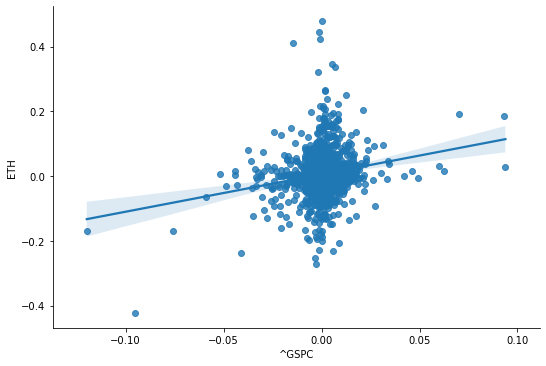

In [68]:
# Showcase beta vs. correlation by plotting a scatterplot using the seaborn library and fitting a regression line
sns.lmplot(x='^GSPC', y='ETH', data=df_daily_returns, aspect=1.5, fit_reg=True)

In [69]:
#rolling beta of LTC
covariance_LTC = df_daily_returns['LTC'].cov(df_daily_returns['^GSPC'])
covariance_LTC

0.0001424219188556933

In [70]:
variance_LTC = df_daily_returns['LTC'].var()
variance_LTC

0.005445032917848108

In [71]:
LTC_beta=covariance_LTC / variance_LTC
LTC_beta

0.026156300798265666

In [72]:
rolling_covariance_LTC= df_daily_returns['LTC'].rolling(window=30).cov(df_daily_returns['^GSPC'])
rolling_covariance_LTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Covariance of LTC Returns vs. S&P 500 Returns')

:Curve   [Date]   (0)

In [73]:
rolling_variance_LTC = df_daily_returns['^GSPC'].rolling(window=30).var()
rolling_variance_LTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Variance of LTC Returns vs. S&P 500 Returns')

:Curve   [Date]   (^GSPC)

In [74]:
rolling_beta_LTC = rolling_covariance_LTC / rolling_variance_LTC
rolling_beta_LTC.hvplot(figsize=(20, 10), title='Rolling 30-Day Beta of LTC')

:Curve   [Date]   (0)

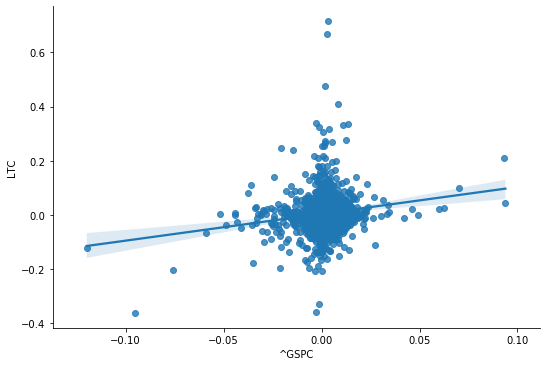

In [75]:
# Showcase beta vs. correlation by plotting a scatterplot using the seaborn library and fitting a regression line
sns.lmplot(x='^GSPC', y='LTC', data=df_daily_returns, aspect=1.5, fit_reg=True)

In [76]:
#Using Pyfolio perform data analysis
# To fix the command & properly show the graphs, you need to open the timeseries.py file in your pyviz anaconda installation and change line 893 with the following code:
   # vallay = underwater.index[np.argmin(underwater)]

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,122.0%
Cumulative returns,5053.2%
Annual volatility,76.9%
Sharpe ratio,1.43
Calmar ratio,1.47
Stability,0.74
Max drawdown,-83.0%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,83.04,2017-12-18,2018-12-14,2020-11-30,771
1,47.29,2021-04-13,2021-06-08,NaT,NaN
2,35.51,2017-09-01,2017-09-14,2017-10-12,30
3,32.65,2017-01-04,2017-01-11,2017-02-23,37
4,28.56,2016-06-16,2016-08-02,2016-12-02,122


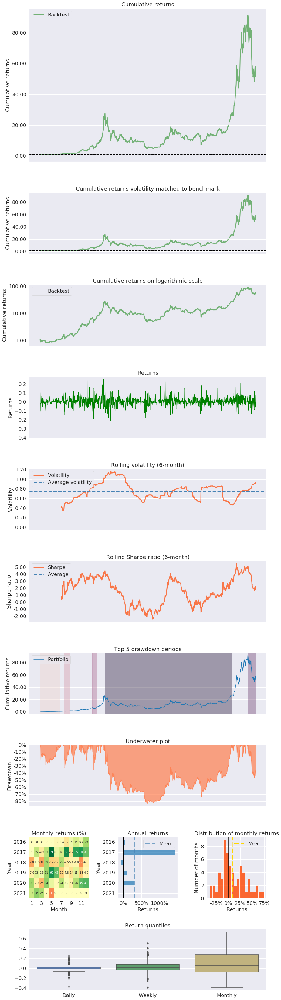

In [77]:
pf.create_returns_tear_sheet(df_daily_returns['BTC'])

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,161.5%
Cumulative returns,11481.9%
Annual volatility,149.3%
Sharpe ratio,1.29
Calmar ratio,1.69
Stability,0.39
Max drawdown,-95.6%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,95.63,2018-01-04,2020-03-12,NaT,NaN
1,60.04,2017-05-17,2017-08-17,2017-12-13,151
2,40.52,2016-10-20,2017-03-01,2017-03-23,111
3,19.95,2017-04-04,2017-04-20,2017-04-28,19
4,19.24,2017-05-08,2017-05-09,2017-05-12,5


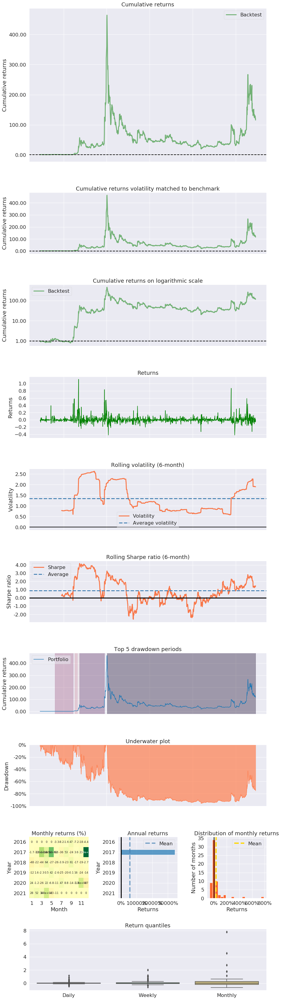

In [78]:
pf.create_returns_tear_sheet(df_daily_returns['XRP'])

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,164.0%
Cumulative returns,12059.2%
Annual volatility,112.8%
Sharpe ratio,1.41
Calmar ratio,1.75
Stability,0.46
Max drawdown,-93.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,93.51,2018-01-09,2018-12-14,2021-01-19,791
1,66.87,2016-06-16,2016-12-05,2017-03-13,193
2,51.90,2017-06-12,2017-07-28,2017-11-27,121
3,46.46,2021-05-11,2021-06-18,NaT,NaN
4,26.23,2021-02-19,2021-02-26,2021-04-01,30


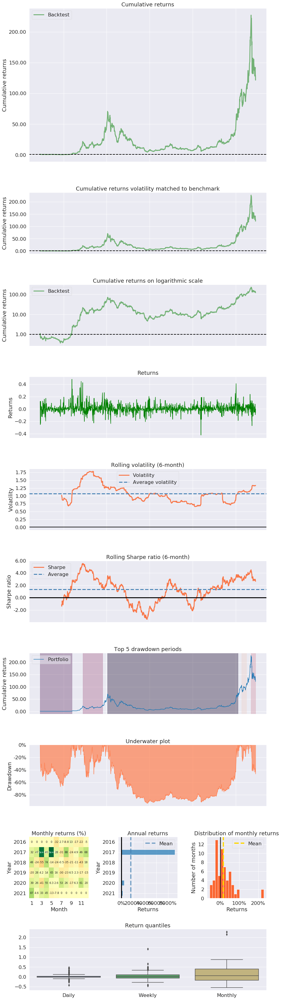

In [79]:
pf.create_returns_tear_sheet(df_daily_returns['ETH'])

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,299.1%
Cumulative returns,93661.0%
Annual volatility,206.1%
Sharpe ratio,1.35
Calmar ratio,3.33
Stability,0.53
Max drawdown,-89.8%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,89.78,2018-01-08,2020-03-12,2021-01-29,800
1,80.51,2017-06-05,2017-09-21,2017-12-18,141
2,57.14,2021-05-07,2021-06-18,NaT,NaN
3,39.88,2021-02-08,2021-02-23,2021-04-13,47
4,39.70,2016-06-16,2017-01-24,2017-04-03,208


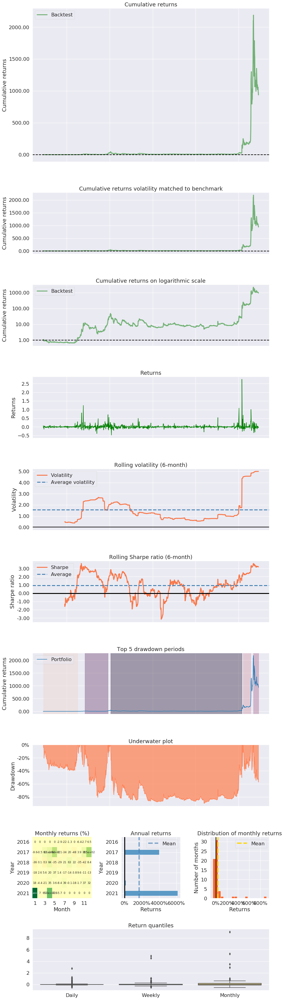

In [80]:
pf.create_returns_tear_sheet(df_daily_returns['DOGE'])

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,98.7%
Cumulative returns,2884.0%
Annual volatility,117.1%
Sharpe ratio,1.14
Calmar ratio,1.06
Stability,0.43
Max drawdown,-93.5%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,93.45,2017-12-18,2018-12-14,2021-05-10,886
1,58.57,2021-05-11,2021-06-18,NaT,NaN
2,51.67,2017-09-01,2017-09-14,2017-11-27,62
3,37.67,2016-06-16,2016-12-05,2017-03-30,206
4,31.07,2017-05-24,2017-05-26,2017-06-16,18


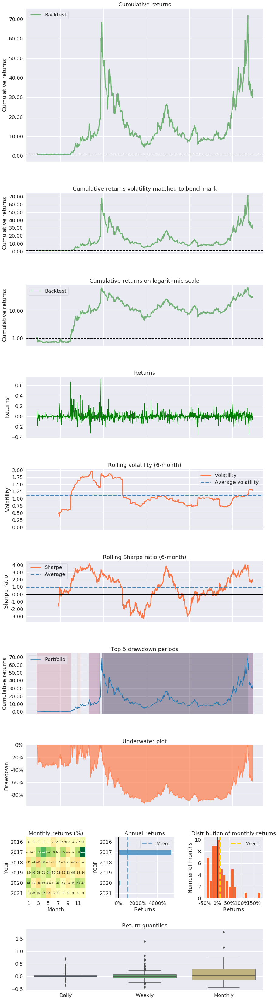

In [81]:
pf.create_returns_tear_sheet(df_daily_returns['LTC'])

Start date,2020-06-16
End date,2021-06-16
Total months,11
,Backtest
Annual return,311.2%
Cumulative returns,302.0%
Annual volatility,73.4%
Sharpe ratio,2.30
Calmar ratio,6.58
Stability,0.85
Max drawdown,-47.3%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,47.29,2021-04-13,2021-06-08,NaT,NaN
1,25.41,2021-01-08,2021-01-27,2021-02-08,22
2,17.32,2020-08-17,2020-09-08,2020-10-21,48
3,17.08,2021-02-19,2021-02-26,2021-03-10,14
4,12.17,2021-03-17,2021-03-25,2021-03-30,10


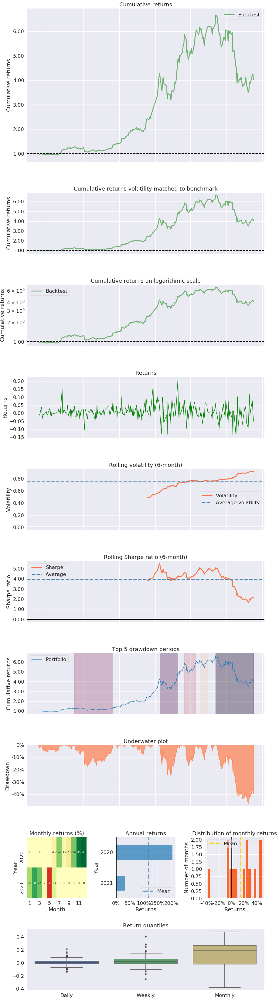

In [82]:
pf.create_returns_tear_sheet(df_1yr_daily_returns['BTC'])

Start date,2020-06-16
End date,2021-06-16
Total months,11
,Backtest
Annual return,35.8%
Cumulative returns,35.2%
Annual volatility,15.7%
Sharpe ratio,2.03
Calmar ratio,3.73
Stability,0.96
Max drawdown,-9.6%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,9.60,2020-09-02,2020-09-23,2020-11-13,53
1,4.23,2021-02-12,2021-03-04,2021-03-11,20
2,4.01,2021-05-07,2021-05-12,2021-06-10,25
3,3.90,2020-06-23,2020-06-26,2020-07-06,10
4,3.66,2021-01-25,2021-01-29,2021-02-04,9


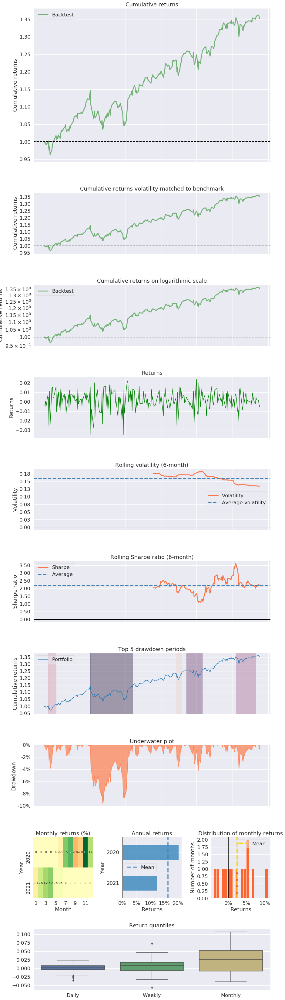

In [83]:
pf.create_returns_tear_sheet(df_1yr_daily_returns['^GSPC'])

Start date,2016-06-15
End date,2021-06-18
Total months,59
,Backtest
Annual return,6.0%
Cumulative returns,33.4%
Annual volatility,13.7%
Sharpe ratio,0.49
Calmar ratio,0.32
Stability,0.70
Max drawdown,-18.8%


Worst drawdown periods,Net drawdown in %,Peak date,Valley date,Recovery date,Duration
0,18.77,2020-08-06,2021-03-08,NaT,NaN
1,17.76,2016-07-08,2016-12-15,2019-06-20,770
2,12.53,2020-03-09,2020-03-19,2020-04-09,24
3,6.58,2019-09-04,2019-11-27,2020-01-06,89
4,4.94,2020-02-24,2020-02-28,2020-03-05,9


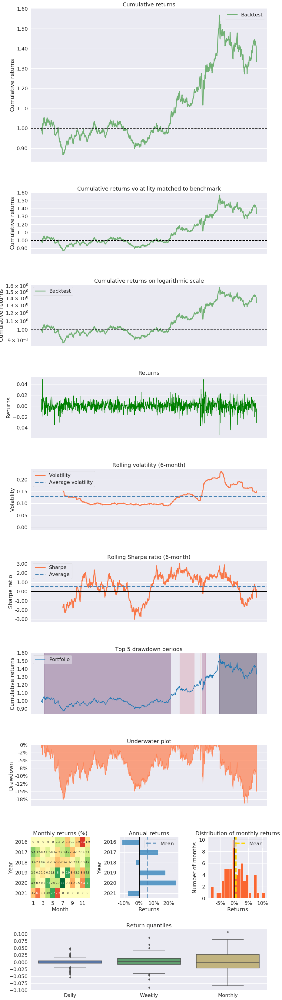

In [84]:
pf.create_returns_tear_sheet(df_daily_returns['Gold Trust'])